In [1]:
import json
import random
from functools import partial

import ase
from ase import build, visualize, io
import e3nn.io
from e3nn import o3, io
from e3nn_invstutorial import radial_spherical_tensor, orthonormal_radial_basis
import ipywidgets
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas
from plotly import subplots
import plotly.graph_objects as go
import plotly.express as px
from scipy.spatial.transform import Rotation
import sympy
import torch

import utils

torch.set_default_dtype(torch.float32)
np.set_printoptions(precision=2)

In [2]:
# Some common functions I want to use

def show_array(positions, calc=None):
    if calc is None:
        calc = lambda x: x
    
    fig = px.imshow(calc(positions), color_continuous_scale='RdBu', zmin=-5, zmax=5)
    widget = go.FigureWidget(fig)

    @ipywidgets.interact(
        xrot=(0, 360, 1.),
        xtrans=(-10, 10, 1.),
        swap=(0, len(positions) - 1, 1)
    )
    def update(xrot=0, xtrans=0, swap=0):
        with widget.batch_update():
            pos = positions.copy()
            
            # Permute
            if swap:
                pos[[swap, 0]] = pos[[0, swap]]
                
            # Translate
            if xtrans:
                pos[:, 0] += xtrans
            
            # Rotate
            if xrot:
                rot = Rotation.from_euler('x', [xrot], degrees=True)
                pos = rot.apply(pos)
            
            print(pos)
            data = calc(pos).T
            widget.data[0].z = data

    return widget

In [3]:
axis = dict(
    showbackground=False,
    showticklabels=False,
    showgrid=False,
    zeroline=False,
    title='',
    nticks=3,
)

layout = dict(
    width=690,
    height=160,
    scene=dict(
        xaxis=dict(
            **axis,
            range=[-8, 8]
        ),
        yaxis=dict(
            **axis,
            range=[-2, 2]
        ),
        zaxis=dict(
            **axis,
            range=[-2, 2]
        ),
        aspectmode='manual',
        aspectratio=dict(x=8, y=2, z=2),
        camera=dict(
            up=dict(x=0, y=0, z=1),
            center=dict(x=0, y=0, z=0),
            eye=dict(x=0, y=-5, z=5),
            projection=dict(type='orthographic'),
        ),
    ),
    paper_bgcolor="rgba(0,0,0,0)",
    plot_bgcolor="rgba(0,0,0,0)",
    margin=dict(l=0, r=0, t=0, b=0)
)

# cmap_bwr = [[0, 'rgb(0,50,255)'], [0.5, 'rgb(200,200,200)'], [1, 'rgb(255,50,0)']]

def s2_grid():
    betas = torch.linspace(0, math.pi, 40)
    alphas = torch.linspace(0, 2 * math.pi, 80)
    beta, alpha = torch.meshgrid(betas, alphas)
    return o3.angles_to_xyz(alpha, beta)

def trace(r, f, c, radial_abs=True):
    if radial_abs:
        a = f.abs()
    else:
        a = 1
    return dict(
        x=a * r[..., 0] + c[0],
        y=a * r[..., 1] + c[1],
        z=a * r[..., 2] + c[2],
        surfacecolor=f
    )

def plot(data, radial_abs=True):
    r = s2_grid()
    n = data.shape[-1]
    traces = [
        trace(r, data[..., i], torch.tensor([2.0 * i - (n - 1.0), 0.0, 0.0]), radial_abs=radial_abs)
        for i in range(n)
    ]
    cmax = max(d['surfacecolor'].abs().max().item() for d in traces)
    traces = [go.Surface(**d, colorscale='RdBu', cmin=-cmax, cmax=cmax) for d in traces]
    fig = go.Figure(data=traces, layout=layout)
    fig.show()
    
def plot_sphere(r):
    fig = go.Figure(
        data=[
            go.Scatter3d(
                x=r[..., 0].flatten(),
                y=r[..., 1].flatten(),
                z=r[..., 2].flatten(),
                mode='markers',
                marker=dict(
                    size=1,
                ),
            )
        ],
        layout=dict(
            width=500,
            height=300,
            scene=dict(
                xaxis=dict(
                    **axis,
                    range=[-1, 1]
                ),
                yaxis=dict(
                    **axis,
                    range=[-1, 1]
                ),
                zaxis=dict(
                    **axis,
                    range=[-1, 1]
                ),
                aspectmode='manual',
                aspectratio=dict(x=3, y=3, z=3),
                camera=dict(
                    up=dict(x=0, y=0, z=1),
                    center=dict(x=0, y=0, z=0),
                    eye=dict(x=0, y=-5, z=5),
                    projection=dict(type='orthographic'),
                ),
            ),
            paper_bgcolor="rgba(0,0,0,0)",
            plot_bgcolor="rgba(0,0,0,0)",
            margin=dict(l=0, r=0, t=0, b=0)
        )
    )
    fig.show()

    
def random_point_signal(lmax, N=5, r_min=1e-1, std=1.):
    n = N
    points = torch.randn(n, 3) * std / np.sqrt(3.)
    points /= points.norm(2, -1, keepdim=True)
#     select = (points.norm(2, -1) > r_min).nonzero()
    return io.SphericalTensor(lmax, p_val=1, p_arg=-1).from_geometry_adjusted(points)

In [10]:
molecule = build.molecule('CH3COCH3')
utils.view(molecule)

## Radial basis

That's great, but what if my function doesn't lie on the surface of a sphere?  Like, for example, a bunch of atoms in a molecule?  What happens if two atoms are radially _behind_ eachother?

No problem!  We can add a set of radial functions, $R_{nl}(r)$: 

$c_{nl}^m = \int_0^{2\pi} \int_0^\pi \int_0^\infty R_{nl}(r) Y_l^m (\theta, \varphi) f(r, \theta, \varphi) r^2 \sin{\theta} dr d\theta d\varphi \text{,}$

and just as before, we can get our original function back

$\tilde{f}(r, \theta, \phi) = \sum_n^N \sum_l^n \sum_{m = -l}^l c_{nl}^m R_{nl}(r) Y_l^m(\theta, \phi)$,

But what form should we choose for $f$?

A convenient choice is that of a sum of Dirac-delta distributions:

$f(\vec{r}) = \sum_i w_i \delta(\vec{r}_i - \vec{r})$

where $w_i$ can be used to encode atomic species.

### Radial basis

Many choices of radial function possible, we want to restrict ourselves to those that are mutually orthogonal.

We can achieve this by using cosine series and applying Gram-Schmidt orthogonalisation:

<ipython-input-12-9379180b3209>:11: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



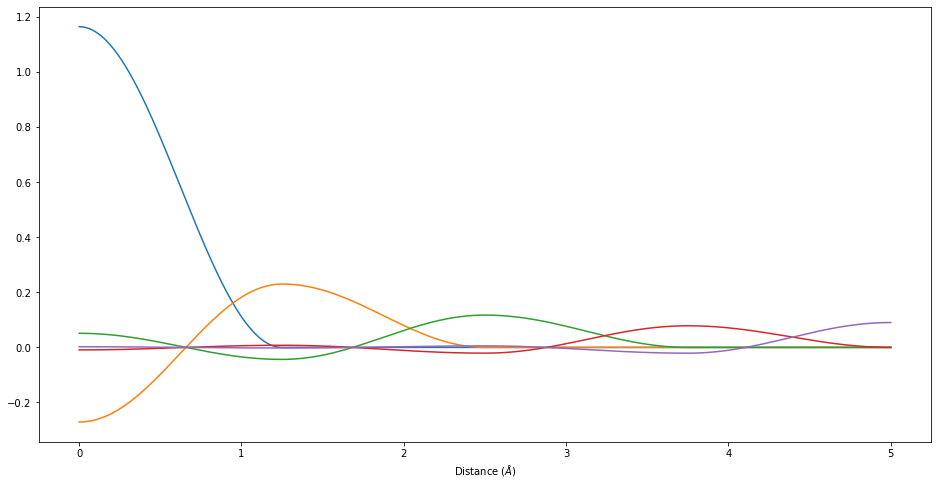

In [12]:
rcut = 5
num_radials = 5

cos_radials = orthonormal_radial_basis.FixedCosineRadialModel(rcut, num_radials)
radials = orthonormal_radial_basis.OrthonormalRadialFunctions(num_radials, cos_radials, rcut, 1024)

r = torch.linspace(0, rcut, 1000)
fig = plt.figure(figsize=(16, 8))
fig.gca().set_xlabel('Distance ($\\AA$)')
p = plt.plot(r, radials(r))
fig.show()

radials(r).shape;

Now, let's combine our radial functions with the spherical harmonics

In [13]:
def create_signal(molecule, radials, num_radials=7, lmax=7):
    p_val = 1
    p_arg = 1
    
    rst = radial_spherical_tensor.RadialSphericalTensor(num_radials, radials, lmax, p_val, p_arg)
    signal = rst.with_peaks_at(
        torch.tensor(molecule.positions, dtype=torch.get_default_dtype()),
        torch.tensor(molecule.numbers, dtype=torch.get_default_dtype()),
    )
    
    return rst, signal

In [14]:
def create_volume(rst, signal, rcut):
    coords, density = rst.signal_on_grid(
        signal, rcut, 25, cropBases=True, cutoffRadiusInner = None, useCache = False)
    
    X, Y, Z = np.meshgrid(coords, coords, coords, indexing='ij')
    return go.Volume(
        x=X.flatten(), y=Y.flatten(), z=Z.flatten(),
        value=density.flatten(),
        isomin=.75,
        isomax=1.0,
        opacity=0.25,
        surface_count=3,
        caps= dict(x_show=False, y_show=False, z_show=False),
        cmin=-1,
        cmax=1,
    )

In [18]:
nrows = 1
ncols = 4
fig = subplots.make_subplots(
    rows=nrows, cols=ncols, specs=[[{'type': 'volume'}] * ncols] * nrows,
    column_titles = [f'$l_{{max}} = {l}$' for l in range(3, 3 + ncols)],
    row_titles = [f'n = {n}' for n in range(3, 3 + nrows)],
    horizontal_spacing=0.01, vertical_spacing=0.01, row_heights=[28] * nrows, column_widths=[5] * ncols
)
fig.update_layout(width=2000, height=600)

for row in range(nrows):
    for col in range(ncols):
        rst, signal = create_signal(molecule, radials, num_radials=row+3, lmax=col+3)
        vol = create_volume(rst, signal, rcut)
        fig.add_trace(vol, row=row + 1, col=col + 1)

fig.show()

### Invariants

In [20]:
p_val = 1
p_arg = 1
lmax = 7
rst = radial_spherical_tensor.RadialSphericalTensor(num_radials, radials, lmax, p_val, p_arg)

def calculate_signal(pos):
    pos = torch.tensor(pos, dtype=torch.get_default_dtype())
    signal = rst.with_peaks_at(pos).numpy()
       
    return 2 * signal.reshape(num_radials, -1).T

show_array(molecule.positions, calculate_signal)

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

In [21]:
rst = radial_spherical_tensor.RadialSphericalTensor(4, radials, 3, p_val, p_arg)
ps_product = o3.ReducedTensorProducts(
    'ij=ji', i=rst, filter_ir_out=list(o3.Irrep.iterator(lmax=0)))

ps = lambda x: ps_product(x, x)

def calc_invariants(pos):
    pos = torch.tensor(pos, dtype=torch.get_default_dtype())
    
    spectrum = ps(rst.with_peaks_at(pos))
    return spectrum.numpy().reshape(-1, 1)

show_array(molecule.positions, calc_invariants)

interactive(children=(FloatSlider(value=0.0, description='xrot', max=360.0, step=1.0), FloatSlider(value=0.0, …

FigureWidget({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>c…

## Hands on

Now it's your turn...try playing around with the `tutorial01` notebook which demonstrates everything we've seen here as well as how to use gradients to recover atomic positions from a set of invariants.
